# **FASHION SEARCH AI**

### Part 1

***Problem Statement*** - The Fashion Search AI project aims to develop a generative search system capable of searching through extensive fashion product descriptions to recommend appropriate choices based on user queries. This system leverages advanced machine learning models, specifically utilizing the LlamaIndex for efficient indexing and retrieval of product data.


### RAG - System Architecture


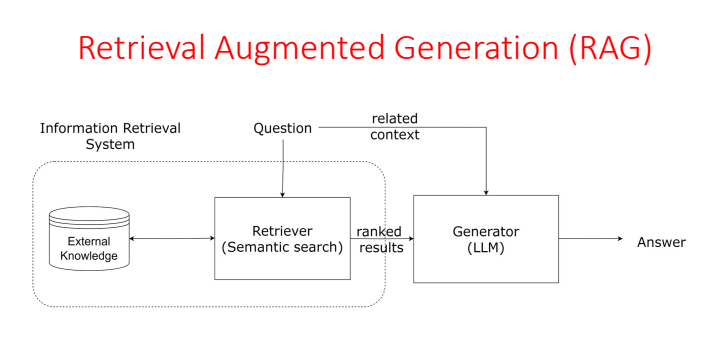

The basic RAG pipeline in LlamaIndex is illustrated below.

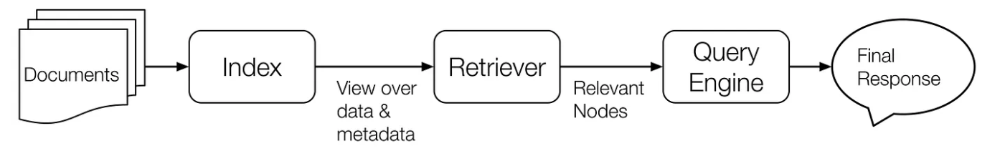

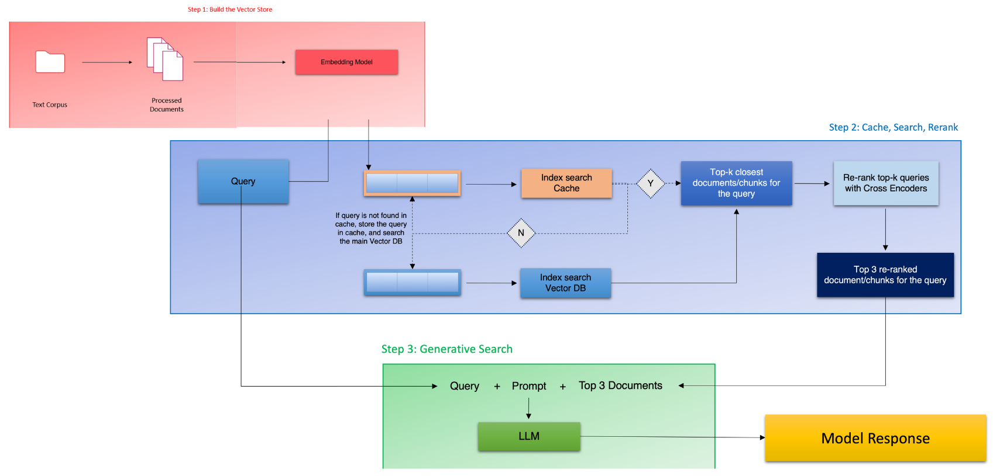

**Step 1** : Import the necessary libraries

In [1]:
# Install OpenAI, LlamaIndex
!pip install -U -qq llama-index openai

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.5/15.5 MB 25.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 337.0/337.0 kB 14.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 22.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.8/295.8 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 21.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.2/49.2 kB 2.6 MB/s eta 0:00:00


In [2]:
## Install additional supporting libraries as required
!pip install -U -q tiktoken openai chromaDB sentence-transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.1/40.1 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.5/48.5 kB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.3/67.3 kB 3.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.0/58.0 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 54.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 584.3/584.3 kB 33.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 58.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.1/227.1 kB 14.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 273.8/273.8 kB 16.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.2/92.2 kB 7.0 MB/s eta 

In [3]:
# Importing the libraries
# LlamaIndex is a library for working with OpenAI's API
from llama_index.llms.openai import OpenAI
from llama_index.core.llms import ChatMessage

# os and openai libraries are used to interact with the operating system and OpenAI's API respectively
import os
import openai

import pandas as pd # Data manipulation library
from pathlib import Path # Work with file system paths
from operator import itemgetter # Accessing elements from a list of tuples or dictionaries
import json # Working with JSON data
import tiktoken # Tokenizing text data
import chromadb # Working with Chroma's database
from tenacity import retry, wait_random_exponential, stop_after_attempt #Retrying operations with exponential backoff

# Creating visualizations
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from PIL import Image # Image processing

# IPython's display module is used for displaying HTML content in notebooks
from IPython.display import display, HTML

# Cross-encoder models and utilities
from sentence_transformers import CrossEncoder, util

/usr/local/lib/python3.10/dist-packages/sentence_transformers/cross_encoder/CrossEncoder.py:11: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange


**Step 2**: Mount your Google Drive and Set the API key

In [4]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive', force_remount = True)

Mounted at /content/drive


In [5]:
# Set the API key
filepath = "/content/drive/MyDrive/"
with open(filepath + "OpenAI Key.txt", "r") as f:
  openai.api_key = ' '.join(f.readlines())

Step 3 - Data Loading

- Import the necessary loader
- Instantiate the reader with the input directory to the files
- Create document objects and load the data

In [7]:
# Defining and reading the data

# Define the path to the dataset
path  = "/content/drive/MyDrive/HelpMate AI/"

# Read the CSV file into a DataFrame
fashion_df = pd.read_csv(path + "Fashion_Dataset.csv")

# Display the first few rows of the DataFrame
fashion_df.head(10)

,p_id,name,products,price,colour,brand,ratingCount,avg_rating,description,p_attributes
0,17048614,Khushal K Women Black Ethnic Motifs Printed Ku...,"Kurta, Palazzos, Dupatta",5099.0,Black,Khushal K,4522.0,4.418399,black printed kurta with palazzos with dupatta...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32..."
1,16524740,InWeave Women Orange Solid Kurta with Palazzos...,"Kurta, Palazzos, Floral Print Dupatta",5899.0,Orange,InWeave,1081.0,4.119334,orange solid kurta with palazzos with dupatta ...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32..."
2,16331376,Anubhutee Women Navy Blue Ethnic Motifs Embroi...,"Kurta, Trousers, Dupatta",4899.0,Navy Blue,Anubhutee,1752.0,4.161530,navy blue embroidered kurta with trousers with...,"{'Add-Ons': 'NA', 'Body Shape ID': '333,424', ..."
3,14709966,Nayo Women Red Floral Printed Kurta With Trous...,"Kurta, Trouser, Dupatta",3699.0,Red,Nayo,4113.0,4.088986,red printed kurta with trouser and dupatta kur...,"{'Add-Ons': 'NA', 'Body Shape ID': '333,424', ..."
4,11056154,AHIKA Women Black & Green Printed Straight Kurta,Kurta,1350.0,Black,AHIKA,21274.0,3.978377,"black and green printed straight kurta, has a ...","{'Body Shape ID': '424', 'Body or Garment Size..."
5,18704418,Soch Women Red Thread Work Georgette Anarkali ...,Anarkali Kurta,3498.0,Red,Soch,0.0,0.000000,colour red solid woven design mandarin collar ...,"{'Body Shape ID': '333,324,424', 'Body or Garm..."
6,14046594,Libas Women Navy Blue Pure Cotton Floral Print...,"Kurta, Palazzos, Dupatta",3599.0,Navy Blue,Libas,8695.0,4.435653,"stately and versatile, this kurta set will be ...","{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32..."
7,14951330,Ahalyaa Women Beige Floral Printed Regular Got...,"Kurta, Palazzos, Dupatta",6000.0,Beige,Ahalyaa,1741.0,3.545089,"when in doubt, rock this simple yet stylish ku...","{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32..."
8,13791594,Anouk Women Yellow & White Printed Kurta with ...,"Kurta, Palazzos",1999.0,Yellow,Anouk,7012.0,4.245864,yellow and white printed kurta with palazzos y...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32..."
9,17048604,Khushal K Women Green & Pink Printed Pure Cott...,"Kurta, Palazzos, Dupatta",5299.0,Green,Khushal K,1590.0,4.266038,green pink printed kurta with palazzos dupatta...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32..."


In [8]:
# Checking the Dataframe information
print(fashion_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14214 entries, 0 to 14213
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   p_id          14214 non-null  int64  
 1   name          14214 non-null  object 
 2   products      14214 non-null  object 
 3   price         14214 non-null  float64
 4   colour        14214 non-null  object 
 5   brand         14214 non-null  object 
 6   ratingCount   14214 non-null  float64
 7   avg_rating    14214 non-null  float64
 8   description   14214 non-null  object 
 9   p_attributes  14214 non-null  object 
dtypes: float64(3), int64(1), object(6)
memory usage: 1.1+ MB
None


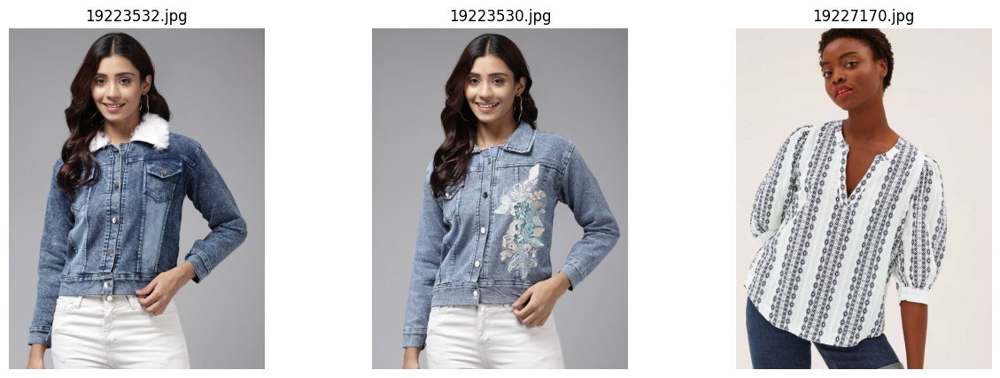

In [9]:
# Defining and reading the images

# Define the path to the image folder
image_folder  = "/content/drive/MyDrive/HelpMate AI/images"

# List all files in the directory
image_files = [f for f in os.listdir(image_folder) if os.path.isfile(os.path.join(image_folder, f))]

# Select the first 3 image files
first_3_images = image_files[:3]

# Create a DataFrame to store image filenames
image_df = pd.DataFrame(first_3_images, columns=['Filename'])

# Display the first 3 images in a line with their filenames
plt.figure(figsize=(15, 5))

# Iterate through the images
for i, image_file in enumerate(first_3_images):
    img = mpimg.imread(os.path.join(image_folder, image_file)) # Read the image from the file
    plt.subplot(1, 3, i+1) # Create a subplot
    plt.imshow(img) # Display the image
    plt.title(image_file) # Set the title as the filename
    plt.axis('off')

# Show the plot with the images
plt.show()

Step 4 - Building the query engine

The general process for creating the query_engine is:
- Load the data and images
- Initialise the Query Engine
- Query the prompt
- Generate the response using the retrieved nodes

## LAYER 1 - EMBEDDING LAYER

### Generate and Store Embeddings using OpenAI and ChromaDB

In [10]:
# Import the OpenAI Embedding Function into chroma
from chromadb.utils.embedding_functions import OpenAIEmbeddingFunction

In [11]:
# Define the path where chroma collections will be stored
chroma_data_path = '/content/drive/MyDrive/HelpMate AI/ChromaDB_Data'

In [12]:
# Call PersistentClient()
client = chromadb.PersistentClient()

In [13]:
# Set up the embedding function using the OpenAI embedding model
model = "text-embedding-ada-002"
embedding_function = OpenAIEmbeddingFunction(api_key=openai.api_key, model_name=model)

In [14]:
# Convert the data to a dictionary format with metadata
fashion_df['metadata'] = fashion_df.apply(
    lambda x: {
        'Product_ID': x['p_id'],  # Unique identifier for the product
        'Product_Name': x['name'],  # Product name
        'Product': x['products'],  # Product category
        'Price (INR)': x['price'],  # Product price in Rupees
        'Colour': x['colour'],  # Product color
        'Brand': x['brand'],  # Product brand
        'Rating_Count': x['ratingCount'],  # Count of ratings
        'Rating (Avg)': x['avg_rating'],  # Average rating of the product
        'Description': x['description'],  # Product Description of the product
        'Product_Attributes': x['p_attributes']  # Product Attribute
    }, axis=1
)

# Display the first few rows of the DataFrame
fashion_df.head()

,p_id,name,products,price,colour,brand,ratingCount,avg_rating,description,p_attributes,metadata
0,17048614,Khushal K Women Black Ethnic Motifs Printed Ku...,"Kurta, Palazzos, Dupatta",5099.0,Black,Khushal K,4522.0,4.418399,black printed kurta with palazzos with dupatta...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32...","{'Product_ID': 17048614, 'Product_Name': 'Khus..."
1,16524740,InWeave Women Orange Solid Kurta with Palazzos...,"Kurta, Palazzos, Floral Print Dupatta",5899.0,Orange,InWeave,1081.0,4.119334,orange solid kurta with palazzos with dupatta ...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32...","{'Product_ID': 16524740, 'Product_Name': 'InWe..."
2,16331376,Anubhutee Women Navy Blue Ethnic Motifs Embroi...,"Kurta, Trousers, Dupatta",4899.0,Navy Blue,Anubhutee,1752.0,4.161530,navy blue embroidered kurta with trousers with...,"{'Add-Ons': 'NA', 'Body Shape ID': '333,424', ...","{'Product_ID': 16331376, 'Product_Name': 'Anub..."
3,14709966,Nayo Women Red Floral Printed Kurta With Trous...,"Kurta, Trouser, Dupatta",3699.0,Red,Nayo,4113.0,4.088986,red printed kurta with trouser and dupatta kur...,"{'Add-Ons': 'NA', 'Body Shape ID': '333,424', ...","{'Product_ID': 14709966, 'Product_Name': 'Nayo..."
4,11056154,AHIKA Women Black & Green Printed Straight Kurta,Kurta,1350.0,Black,AHIKA,21274.0,3.978377,"black and green printed straight kurta, has a ...","{'Body Shape ID': '424', 'Body or Garment Size...","{'Product_ID': 11056154, 'Product_Name': 'AHIK..."


In [15]:
# Function to extract metadata from the dataframe
def extract_text(metadata):
    """
    Extract text content from the given metadata dictionary.

    Args:
    metadata (dict): A dictionary containing metadata information.

    Returns:
    str: A string containing the extracted text content, which includes
         the product description and name, or a default message if neither
         is available.
    """

    text_content = ""
    # Check if "Description" key exists in metadata and has a non-empty value
    if "Description" in metadata and metadata["Description"]:
        text_content += metadata["Description"]  # Add product description

    # Check if "name" key exists in metadata
    if "name" in metadata:
        text_content += " " + metadata["name"]  # Add product name

    # If text_content is still empty, set a default message
    if not text_content:
        text_content = "No description available."
    return text_content.strip()  # Strip leading and trailing whitespace

In [16]:
# Extract text for embedding from each row of metadata
documents = [extract_text(row['metadata']) for _, row in fashion_df.iterrows()]

In [17]:
# Initialise a collection in chroma and pass the embedding_function to it so that it used OpenAI embeddings to embed the records
fashion_collection = client.get_or_create_collection(name='RAG_on_Fashion', embedding_function=embedding_function)

In [18]:
# Add the data to the ChromaDB collection
for idx, (p_id, metadata) in enumerate(zip(fashion_df['p_id'], fashion_df['metadata'])):
    # Print a message indicating the processing and document text of each document
    print(f"Processing document with p_id={p_id}")
    print(f"Document text: {documents[idx]}")

    # Add the current document to the ChromaDB collection
    fashion_collection.add(
        documents=[documents[idx]],  # Text content of the document
        ids=[str(p_id)],  # Unique identifier of the document
        metadatas=[metadata]  # Metadata associated with the document
    )

Streaming output truncated to the last 5000 lines.
Processing document with p_id=12967838
Document text: charcoal grey printed dupatta and has a tasselled border length 2.3metres width 0.9metre material silk blend hand wash
Processing document with p_id=18601482
Document text: white graphic printed open front jacket, has a spread collar, 2 pockets ,has a button closure, long sleeves, straight hemline, without liningthe model height 58 is wearing a size scotton machine wash
Processing document with p_id=13401782
Document text: black solid jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hem, and unlined liningthe model height 58 is wearing a size smaterial cotton machine wash
Processing document with p_id=12178124
Document text: blue washed jacket, has a spread collar, 4 pockets, button closure, long sleeves, straight hem100 cotton machine washthe model height 58 is wearing a size s
Processing document with p_id=17685324
Document text: blue solid lightweigh

In [19]:
# Peek at the first 5 items in the fashion_collection
fashion_collection.peek(5)

{'ids': ['10016743', '10019867', '10035883', '10051259', '10053731'],
 'embeddings': [[-0.00850935559719801,
   -0.006950389593839645,
   0.002606396097689867,
   0.001445291331037879,
   0.007937734946608543,
   0.020383479073643684,
   -0.022007402032613754,
   -0.009490204975008965,
   -0.01687580533325672,
   -0.03307605907320976,
   0.019578013569116592,
   0.015472736209630966,
   0.015459745191037655,
   -0.011594808660447598,
   -0.010704899206757545,
   0.004650915041565895,
   0.01860366016626358,
   0.004046815447509289,
   0.0036668176762759686,
   -0.011172588914632797,
   -0.008152092806994915,
   0.02925659343600273,
   0.003637587185949087,
   -0.016862815245985985,
   0.005599285941570997,
   0.028814885765314102,
   0.007522010710090399,
   -0.011133614927530289,
   0.02678823098540306,
   -0.005605781450867653,
   -0.0059045832604169846,
   -0.012595145031809807,
   -2.7555939595913514e-05,
   -0.03395947441458702,
   -0.007632437162101269,
   0.009827980771660805,
 

In [20]:
# Create or retrieve the 'Fashion_Cache' collection with the embedding function
cache_collection = client.get_or_create_collection(name='Fashion_Cache', embedding_function=embedding_function)

In [21]:
# Peek at the items in the cache_collection
cache_collection.peek()

{'ids': [],
 'embeddings': [],
 'metadatas': [],
 'documents': [],
 'uris': None,
 'data': None,
 'included': ['embeddings', 'metadatas', 'documents']}

## LAYER 2 - SEMANTIC SEARCH AND RERANKING LAYER

#### Semantic Search with Cache

In [22]:
# Read the user query
query = input()

White summer dress


In [23]:
# Searh the Cache collection first
# Query the collection against the user query and return the top 3 results
cache_results = cache_collection.query(
    query_texts=query,
    n_results=3
)

# Display the results
cache_results

{'ids': [[]],
 'distances': [[]],
 'metadatas': [[]],
 'embeddings': None,
 'documents': [[]],
 'uris': None,
 'data': None,
 'included': ['metadatas', 'documents', 'distances']}

In [24]:
# Implementing Cache in Semantic Search

# Set a threshold for cache search
threshold = 0.2

ids = []
documents = []
distances = []
metadatas = []
results_df = pd.DataFrame()

# Check if the distance is greater than the threshold, if so, return results from the main collection
if cache_results['distances'][0] == [] or cache_results['distances'][0][0] > threshold:
    # Query the collection against the user query and return the results
    results = fashion_collection.query(
        query_texts=query,
        n_results=5
    )

    # Store the query in cache_collection as a document with respect to ChromaDB for future reference
    # Store retrieved text, ids, distances, and metadatas in cache_collection as metadatas, so they can be fetched easily if a query indeed matches to a query in cache
    Keys = []
    Values = []

    for key, val in results.items():
        if val is None:
            continue
        for i in range(len(val[0])):  # Iterate over the actual length of val
            Keys.append(str(key) + str(i))
            if len(val[0]) > i:  # Check if the current index exists in val
                Values.append(str(val[0][i]))

    cache_collection.add(
        documents=[query],
        ids=[query],
        metadatas=dict(zip(Keys, Values))
    )

    # Print message indicating the results are found in the main collection
    print("Not found in cache. Found in the main collection.")

    # Construct a DataFrame from the query results
    result_dict = {'Metadatas': results['metadatas'][0], 'Documents': results['documents'][0], 'Distances': results['distances'][0], "IDs": results["ids"][0]}
    results_df = pd.DataFrame.from_dict(result_dict)


# If the distance is less than the threshold, return results from the cache
elif cache_results['distances'][0][0] <= threshold and cache_results['ids']:
    cache_result_dict = cache_results['metadatas'][0][0]

    # Loop through each inner list and then through the dictionary
    for key, value in cache_result_dict.items():
        if 'ids' in key:
            ids.append(value)
        elif 'documents' in key:
            documents.append(value)
        elif 'distances' in key:
            distances.append(value)
        elif 'metadatas' in key:
            metadatas.append(value)

    # Print message indicating the results are found in the cache
    print("Found in cache!")

    # Create a DataFrame from the cached results
    results_df = pd.DataFrame({
        'IDs': ids,
        'Documents': documents,
        'Distances': distances,
        'Metadatas': metadatas
    })
else:
    # Print message indicating no valid results found in cache
    print("No valid results found in cache!")

Not found in cache. Found in the main collection.


In [25]:
# Define the function to print query with a prefix and separator
def print_query_with_separator(prefix, query):
    # Print the prefix
    print(prefix)
    # Insert a newline character after every full stop
    query_with_newlines = query.replace(". ", ".\n")
    # Print the modified query
    print(query_with_newlines)

# Print the query with prefix and separator
print_query_with_separator("Query: ", query)

# Print the IDs from the results DataFrame
print("IDs:")

Query: 
White summer dress
IDs:


In [26]:
# Query the cache collection for results matching the user query
cache_results = cache_collection.query(
    query_texts=query,
    n_results=1
)

# Print the cache results
cache_results

{'ids': [['White summer dress']],
 'distances': [[0.0]],
 'metadatas': [[{'distances0': '0.2892138957977295',
    'distances1': '0.29283058643341064',
    'distances2': '0.29355984926223755',
    'distances3': '0.29450616240501404',
    'distances4': '0.2970200777053833',
    'documents0': 'white and blue printed playsuit with layered skirt, has a round neck and short sleeves.the model height 58 is wearing a size s95 polyester, 5 elastane machine wash',
    'documents1': 'white and blue printed basic jumpsuit with waist tieups ,has a offshoulder, short sleeves, pocketsthe model height 58 is wearing a size spolyester handwash or dryclean only',
    'documents2': 'white, pink and blue dyed basic jumpsuit with waist tieups ,has a round neck, sleeveless, 2 pocketsthe model height 58 is wearing a size spolyester machine wash',
    'documents3': 'blue and white striped playsuit with waist tieups ,has a round neck, short sleeves, pocketsthe model height 58 is wearing a size s90 polyester, 10 

#### Reranking

In [27]:
# Initialise the cross encoder model

cross_encoder = CrossEncoder('cross-encoder/ms-marco-MiniLM-L-6-v2')

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/794 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

In [28]:
# Create input pairs for the cross encoder, consisting of each query paired with each response
cross_inputs = [[query, response] for response in results_df['Documents']]

# Generate cross-encoder scores for the input pairs
cross_rerank_scores = cross_encoder.predict(cross_inputs)

# Display the cross-encoder scores
cross_rerank_scores

array([-3.2063808, -6.497525 , -5.7039013, -6.7721176, -7.3602896],
      dtype=float32)

In [29]:
# Add the cross-encoder scores to the results DataFrame
results_df['Reranked_scores'] = cross_rerank_scores

# Display the updated results DataFrame
results_df

,Metadatas,Documents,Distances,IDs,Reranked_scores
0,"{'Brand': 'I Saw It First', 'Colour': 'White',...",white and blue printed playsuit with layered s...,0.289214,17403434,-3.206381
1,"{'Brand': 'Mayra', 'Colour': 'White', 'Descrip...",white and blue printed basic jumpsuit with wai...,0.292831,17509632,-6.497525
2,"{'Brand': 'URBANIC', 'Colour': 'White', 'Descr...","white, pink and blue dyed basic jumpsuit with ...",0.293560,15082272,-5.703901
3,"{'Brand': 'ZALORA BASICS', 'Colour': 'Blue', '...",blue and white striped playsuit with waist tie...,0.294506,16388990,-6.772118
4,"{'Brand': 'Poshak Hub', 'Colour': 'Blue', 'Des...","blue, beige, and white striped basic jumpsuit ...",0.297020,17351420,-7.360290


In [30]:
# Return the top 3 results from semantic search based on the Distance
top_3_semantic = results_df.sort_values(by='Distances', ascending=False)[:3]

# Display the top 3 semantic search results
top_3_semantic

,Metadatas,Documents,Distances,IDs,Reranked_scores
4,"{'Brand': 'Poshak Hub', 'Colour': 'Blue', 'Des...","blue, beige, and white striped basic jumpsuit ...",0.297020,17351420,-7.360290
3,"{'Brand': 'ZALORA BASICS', 'Colour': 'Blue', '...",blue and white striped playsuit with waist tie...,0.294506,16388990,-6.772118
2,"{'Brand': 'URBANIC', 'Colour': 'White', 'Descr...","white, pink and blue dyed basic jumpsuit with ...",0.293560,15082272,-5.703901


In [31]:
# Return the top 3 results after reranking
top_3_rerank = results_df.sort_values(by='Reranked_scores', ascending=False)

# Display top_3_rerank search results
top_3_rerank

,Metadatas,Documents,Distances,IDs,Reranked_scores
0,"{'Brand': 'I Saw It First', 'Colour': 'White',...",white and blue printed playsuit with layered s...,0.289214,17403434,-3.206381
2,"{'Brand': 'URBANIC', 'Colour': 'White', 'Descr...","white, pink and blue dyed basic jumpsuit with ...",0.293560,15082272,-5.703901
1,"{'Brand': 'Mayra', 'Colour': 'White', 'Descrip...",white and blue printed basic jumpsuit with wai...,0.292831,17509632,-6.497525
3,"{'Brand': 'ZALORA BASICS', 'Colour': 'Blue', '...",blue and white striped playsuit with waist tie...,0.294506,16388990,-6.772118
4,"{'Brand': 'Poshak Hub', 'Colour': 'Blue', 'Des...","blue, beige, and white striped basic jumpsuit ...",0.297020,17351420,-7.360290


In [32]:
# Select the relevant columns from the reranked DataFrame
top_3_RAG = top_3_rerank[["Documents", "Metadatas","IDs"]]

# Display the resulting DataFrame with the selected columns
top_3_RAG

,Documents,Metadatas,IDs
0,white and blue printed playsuit with layered s...,"{'Brand': 'I Saw It First', 'Colour': 'White',...",17403434
2,"white, pink and blue dyed basic jumpsuit with ...","{'Brand': 'URBANIC', 'Colour': 'White', 'Descr...",15082272
1,white and blue printed basic jumpsuit with wai...,"{'Brand': 'Mayra', 'Colour': 'White', 'Descrip...",17509632
3,blue and white striped playsuit with waist tie...,"{'Brand': 'ZALORA BASICS', 'Colour': 'Blue', '...",16388990
4,"blue, beige, and white striped basic jumpsuit ...","{'Brand': 'Poshak Hub', 'Colour': 'Blue', 'Des...",17351420


## LAYER 3 - GENERATION LAYER

In [33]:
# Function to return responses on user query using ChatCompletion
def generate_response_fashion(query):
    """
    Generate a response using GPT-3.5's ChatCompletion based on the user query and retrieved information.
    """
    messages = [
        {"role": "system", "content":  "You are a helpful AI assistant in the fashion domain, specialized in providing accurate answers to fashion-related queries."},
        {"role": "user", "content": f"""You have received a query from a user looking for fashion-related information. The query is: "{query}".
                                        Additionally, you have obtained the top 3 relevant results from the fashion dataset in the dataframe '{top_3_RAG}'.

                                        The 'Documents' column in this dataframe contains descriptions of fashion items, and the 'Metadatas' column contains additional information such as item name, brand.

                                        Your task is to use the information provided in '{top_3_RAG}' to generate a response to the query "{query}". Ensure that your response is informative and relevant to the user's query. Utilize the metadata to cite the relevant fashion items.

                                        Please adhere to the following guidelines:
                                        1. Provide accurate and relevant information based on the user query and the top 3 search results.
                                        2. You may use any relevant details from the dataframe to craft your response.
                                        3. If any of the fashion items contain tables or structured information, format and present it clearly.
                                        4. Use the metadata to cite the names, brands of the relevant fashion items.
                                        5. If you are unable to provide a complete answer, offer guidance on where the user can find further information within the cited fashion items.
                                        6. As a user-facing assistant, focus on delivering a direct and concise response without delving into technical details.
                                        7. Please note that detailed price and rating information might change from time to time. For more details,you should recommend to visit our website page.

                                        Your response should directly address the user's query and include citations for the referenced fashion items. Present the information in a well-organized and easily understandable format.
                                        """},
    ]

    response = openai.chat.completions.create(
        model="gpt-3.5-turbo",
        messages=messages
    )

    # Extracting p_ids directly from the 'IDs' column in top_3_RAG
    p_ids = top_3_RAG['IDs'].head(3).tolist()

    # Display the images corresponding to the IDs obtained from the response side by side
    num_images = len(p_ids)
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))

    for i, item_id in enumerate(p_ids):
        # Construct the path to the image file
        image_path = os.path.join(image_folder, str(item_id) + '.jpg')

        # Check if the image file exists
        if os.path.exists(image_path):
            # Open and display the image
            img = Image.open(image_path)
            axes[i].imshow(img)
            axes[i].axis('off')
            axes[i].set_title(f"ID: {item_id}")
        else:
            print(f"Image not found for item ID: {item_id}")

    plt.tight_layout()
    plt.show() # Display the images

    # Returning response and p_ids
    return response.choices[0].message.content, p_ids

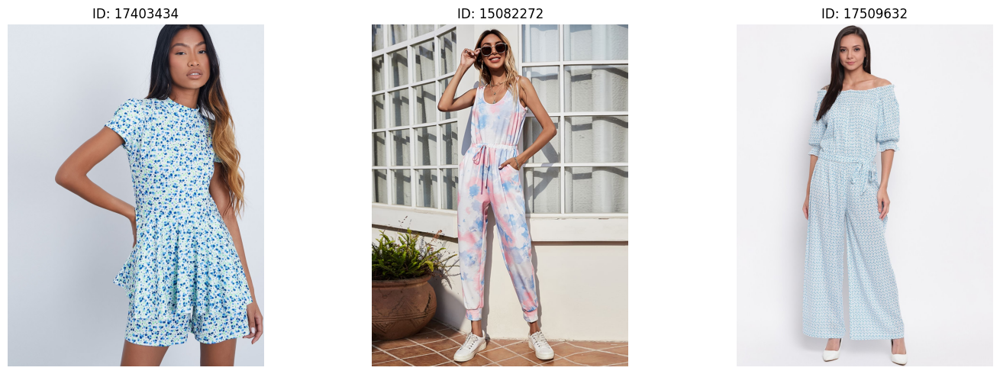

Based on your query for a "White summer dress," here are some relevant fashion items that you might be interested in:

1. **White and Blue Printed Playsuit**
   - **Brand:** I Saw It First
   - **Description:** A white and blue printed playsuit with layered style.
   - **ID:** 17403434

2. **White, Pink, and Blue Dyed Basic Jumpsuit**
   - **Brand:** URBANIC
   - **Description:** A white, pink, and blue dyed basic jumpsuit.
   - **ID:** 15082272

3. **White and Blue Printed Basic Jumpsuit**
   - **Brand:** Mayra
   - **Description:** A white and blue printed basic jumpsuit with waist details.
   - **ID:** 17509632

These fashion items offer different styles that incorporate white hues, which can be suitable for a summer look. For more detailed information on these items or to explore additional white summer dress options, I recommend visiting our website page for the latest updates on prices and availability.


In [34]:
# Generate response and p_ids based on the provided query and top_3_RAG DataFrame
response, p_ids = generate_response_fashion(query)

# Print the response
print(response)

Step 5 - Creating a Response Pipeline

A Query Response pipeline encapsulates all the necssary steps to build a RAG pipeline. Modify the functions `query_response` and `initialize_conv()`  below. The `query_response` functions return the query response from the query engine along with the supporting documents and the `initialize_conv()` function creates an interactive chatbot.

In [35]:
# Function to handle user query and return responses from cache or main collection
def query_response(query_new):
    # Search the Cache collection first
    cache_results = cache_collection.query(query_texts=query_new, n_results=3)

    # Set a threshold for cache search
    threshold = 0.2

    # Initialize results DataFrame
    results_df = pd.DataFrame()

    # Check if the distance is greater than the threshold, if so, return results from the main collection
    if not cache_results['distances'][0] or cache_results['distances'][0][0] > threshold:
        # Query the main collection against the user query and return the results
        results = fashion_collection.query(query_texts=query_new, n_results=5)

        # Store the query in cache_collection as a document with respect to ChromaDB for future reference
        keys, values = [], []
        for key, val in results.items():
            if val is None:
                continue
            for i in range(len(val[0])):  # Iterate over the actual length of val
                keys.append(f"{key}{i}")
                if len(val[0]) > i:  # Check if the current index exists in val
                    values.append(str(val[0][i]))

        cache_collection.add(
            documents=[query_new],
            ids=[query_new],
            metadatas=dict(zip(keys, values))
        )

        # Construct a DataFrame from the query results
        result_dict = {
            'Metadatas': results['metadatas'][0],
            'Documents': results['documents'][0],
            'Distances': results['distances'][0],
            'IDs': results['ids'][0]
        }
        results_df = pd.DataFrame.from_dict(result_dict)

    # If the distance is less than the threshold, return results from the cache
    elif cache_results['distances'][0][0] <= threshold and cache_results['ids']:
        cache_result_dict = cache_results['metadatas'][0][0]

        ids, documents, distances, metadatas = [], [], [], []

        for key, value in cache_result_dict.items():
            if 'ids' in key:
                ids.append(value)
            elif 'documents' in key:
                documents.append(value)
            elif 'distances' in key:
                distances.append(value)
            elif 'metadatas' in key:
                metadatas.append(value)

        results_df = pd.DataFrame({
            'IDs': ids,
            'Documents': documents,
            'Distances': distances,
            'Metadatas': metadatas
        })
    else:
        print("No valid results found in cache!")

    # Initialize the cross encoder model
    cross_encoder = CrossEncoder('cross-encoder/ms-marco-MiniLM-L-6-v2')

    # Create input pairs for the cross encoder, consisting of each query paired with each response
    cross_inputs = [[query_new, response] for response in results_df['Documents']]

    # Generate cross-encoder scores for the input pairs
    cross_rerank_scores = cross_encoder.predict(cross_inputs)

    # Add the cross-encoder scores to the results DataFrame
    results_df['Reranked_scores'] = cross_rerank_scores

    # Return the top 3 results from semantic search based on the Distance
    top_3_semantic = results_df.sort_values(by='Distances', ascending=False)[:3]
    top_3_rerank = results_df.sort_values(by='Reranked_scores', ascending=False)
    top_3_RAG = top_3_rerank[["Documents", "Metadatas", "IDs"]]

    return top_3_RAG

In [36]:
# Function to return responses on user query using ChatCompletion
def generate_response_fashion1(query_new, top_3_RAG):
    """
    Generate a response using GPT-3.5's ChatCompletion based on the user query and retrieved information.
    """
    messages = [
        {"role": "system", "content":  "You are a helpful AI assistant in the fashion domain, specialized in providing accurate answers to fashion-related queries."},
        {"role": "user", "content": f"""You have received a query from a user looking for fashion-related information. The query is: "{query_new}".
                                        Additionally, you have obtained the top 3 relevant results from the fashion dataset in the dataframe '{top_3_RAG}'.

                                        The 'Documents' column in this dataframe contains descriptions of fashion items, and the 'Metadatas' column contains additional information such as item name, brand.

                                        Your task is to use the information provided in '{top_3_RAG}' to generate a response to the query "{query_new}". Ensure that your response is informative and relevant to the user's query. Utilize the metadata to cite the relevant fashion items.

                                        Please adhere to the following guidelines:
                                        1. Provide accurate and relevant information based on the user query and the top 3 search results.
                                        2. You may use any relevant details from the dataframe to craft your response.
                                        3. If any of the fashion items contain tables or structured information, format and present it clearly.
                                        4. Use the metadata to cite the names, brands of the relevant fashion items.
                                        5. If you are unable to provide a complete answer, offer guidance on where the user can find further information within the cited fashion items.
                                        6. As a user-facing assistant, focus on delivering a direct and concise response without delving into technical details.
                                        7. Please note that detailed price and rating information might change from time to time. For more details,you should recommend to visit our website page.

                                        Your response should directly address the user's query and include citations for the referenced fashion items. Present the information in a well-organized and easily understandable format.
                                        """},
    ]

    response = openai.chat.completions.create(
        model="gpt-3.5-turbo", # Model used
        messages=messages
    )

    # Extracting p_ids directly from the 'IDs' column in top_3_RAG
    p_ids = top_3_RAG['IDs'].head(3).tolist()

    # Display the images corresponding to the IDs obtained from the response side by side
    num_images = len(p_ids)
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))

    for i, item_id in enumerate(p_ids):
        # Construct the path to the image file
        image_path = os.path.join(image_folder, str(item_id) + '.jpg')

        # Check if the image file exists
        if os.path.exists(image_path):
            # Open and display the image
            img = Image.open(image_path)
            axes[i].imshow(img)
            axes[i].axis('off')
            axes[i].set_title(f"ID: {item_id}")
        else:
            print(f"Image not found for item ID: {item_id}")

    plt.tight_layout()
    plt.show() # Display images

    # Returning response and p_ids
    return response.choices[0].message.content, p_ids

In [78]:
# Function to initiate conversation by asking for inputs
def initialize_conv():
    """
    Initialize a conversation with the user, allowing them to ask questions
    about fashion items. The user can type 'exit' to end the conversation.

    The function continuously prompts the user for input, processes the input
    using the query_response function, and displays the response. The loop
    terminates when the user types 'exit'.
    """
    while True:
        # Prompt the user for input
        query_new = input("Ask your fashion-related question (or type 'exit' to quit): ").strip()

        # Check if the user wants to exit
        if query_new.lower() == 'exit':
            print("Exiting the conversation. Have a great day!")
            break

        try:
            # Process the input query
            top_3_result = query_response(query_new)
            response, p_ids = generate_response_fashion1(query_new, top_3_result)

            # Display the response
            print(response)

        except Exception as e:
            # Handle any errors that occur
            print(f"An error occurred: {e}")

Ask your fashion-related question (or type 'exit' to quit): Black leather jacket


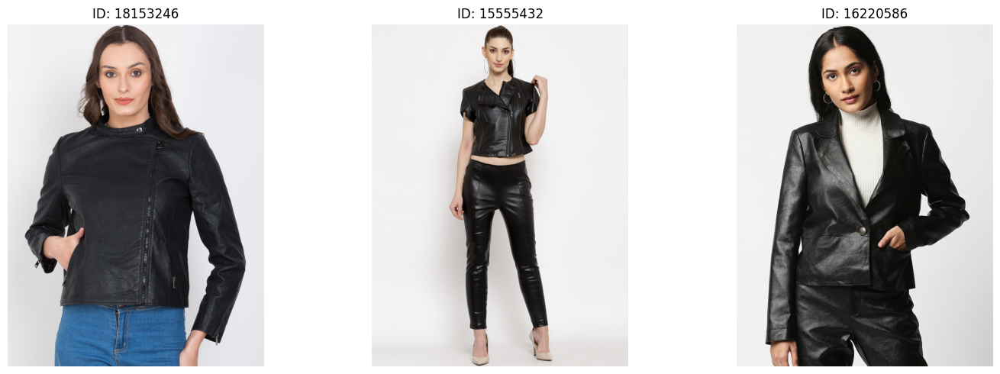

### Response:

#### Black Leather Jackets:

1. **Item 1:**
   - **Description:** Black solid leather jacket with zip detail.
   - **Brand:** Justanned
   - **ID:** 18153246

2. **Item 2:**
   - **Description:** Black solid biker jacket with collarless design.
   - **Brand:** BEAVER
   - **ID:** 15555432

3. **Item 3:**
   - **Description:** Black solid biker jacket with lapel collar.
   - **Brand:** 20Dresses
   - **ID:** 16220586

For more detailed information and to explore additional options, you can visit our website page.
Ask your fashion-related question (or type 'exit' to quit): White T-shirt with prints


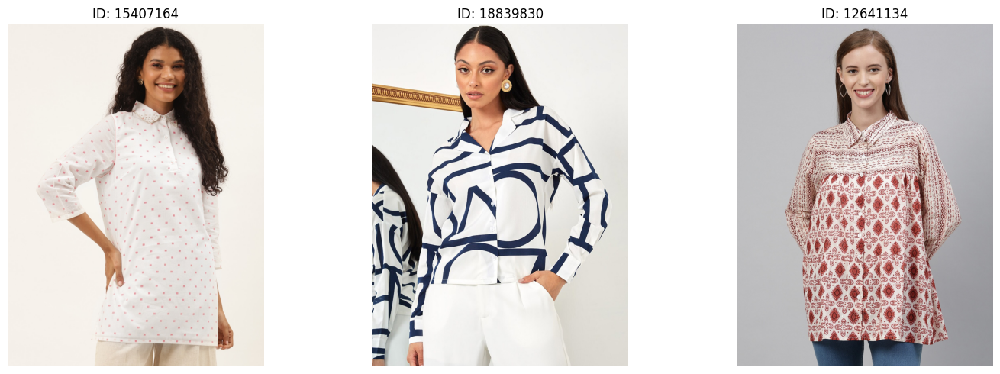

Based on the information provided in the dataset, here are the relevant fashion items related to your query for "White T-shirt with prints":

1. **Global Desi White and Red Printed Woven Shirt**  
   - **Brand:** Global Desi  
   - **Description:** This white T-shirt with red prints features a woven shirt style top.
   - **ID:** 12641134

2. **Styli White Regular Shirt Style Top**  
   - **Brand:** Styli  
   - **Description:** A white T-shirt with horizontal stripes, in a regular shirt style top design.
   - **ID:** 18839830

3. **Ancestry White and Red Regular Shirt Style Top**  
   - **Brand:** Ancestry  
   - **Description:** This white T-shirt with red geometrical prints is designed in a regular shirt style top.
   - **ID:** 15407164

These fashion items contain white T-shirts with different types of prints, fulfilling your search query. For more detailed information on each item, please refer to the respective IDs provided.

If you are interested in exploring additional options o

In [79]:
# Start conversation
initialize_conv()


**Step 7** - Build a Testing Pipeline

Here we feed a series of questions to the Q/A bot and store the responses along with the feedback on whether it's accurate or not from the user

Create atleast 5 questions and store them in the `questions` list to be queried by the RAG system using the `testing_pipeline` function.

In [55]:
# Questions for testing pipeline
questions = [
    "Black leather jacket suitable for versatile use like night outs and long trips.",
    "White dress midi dress.",
    "Dark blue colour denim high waist jeans pant for women. It should have 4+ average rating.",
    "Suits in white colour under Rs. 5000",
    "Pink saree for wedding.",
]

In [71]:
def testing_pipeline(questions):
    """
    Conducts a testing pipeline for a series of questions, collecting user feedback on the responses provided by the bot.

    Args:
        questions (list): A list of questions to be tested.

    Returns:
        pd.DataFrame: A DataFrame containing the questions, their corresponding responses, the page numbers from the response, and the user feedback indicating whether the response was good or bad.
    """

    test_feedback = []

    for question in questions:
        print(f"Question: {question}")

        # Generate the response and product IDs
        top_3_result = query_response(question)
        response, p_ids = generate_response_fashion1(question, top_3_result)

        #Display response and images
        print(f"Response: {response}")
        print('-'*150)

        # Collect user feedback
        while True:
            feedback = input("Is this response helpful? (yes/no): ").lower()
            if feedback in ["yes", "no"]:
                test_feedback.append((question, response, p_ids, feedback))
                break
            else:
                print("Invalid input. Please enter 'yes' or 'no'.")

    # Create a DataFrame from the collected feedback
    feedback_df = pd.DataFrame(test_feedback, columns=['Question', 'Response', 'p_ids', 'Helpful'])
    return feedback_df


Question: Black leather jacket


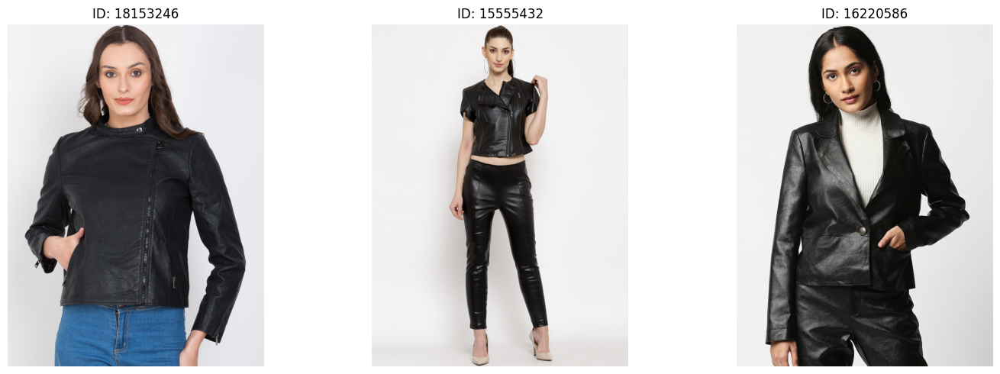

Response: Certainly! Here is the information on black leather jackets based on the top 3 search results from the provided dataset:

1. **Justanned Black Solid Leather Jacket:**
   - **Brand:** Justanned
   - **Description:** Black solid leather jacket with zip detail.
   - **ID:** 18153246
   - This jacket is a stylish and classic option made from high-quality leather, featuring zip details for added flair.

2. **BEAVER Black Solid Biker Jacket:**
   - **Brand:** BEAVER
   - **Description:** Black solid biker jacket with a collarless design.
   - **ID:** 15555432
   - The BEAVER biker jacket offers a modern twist on the classic black leather jacket with its collarless style, perfect for a chic look.

3. **20Dresses Black Solid Biker Jacket:**
   - **Brand:** 20Dresses
   - **Description:** Black solid biker jacket with a lapel collar.
   - **ID:** 16220586
   - This biker jacket by 20Dresses combines the edginess of a biker jacket with the sophistication of a lapel collar, making it a 

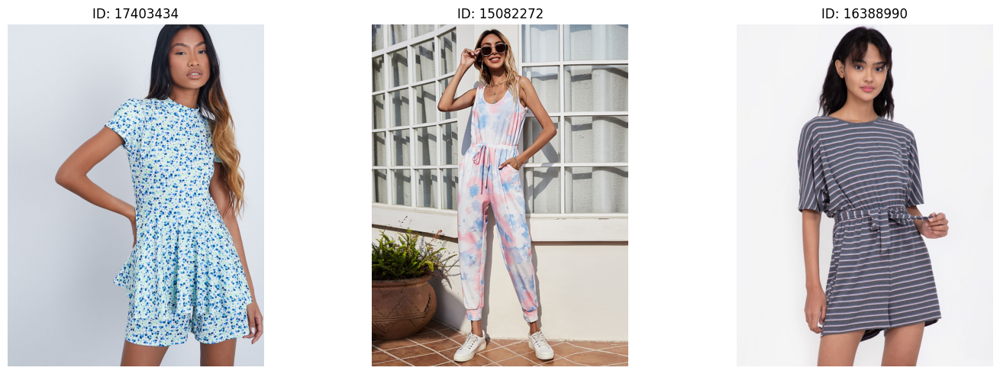

Response: Based on the fashion dataset you provided, here are the top 3 relevant results for a white midi dress:

1. **White and Blue Printed Playsuit with Layered Skirt by I Saw It First**
   - **Brand:** I Saw It First
   - **Description:** This playsuit features a white and blue print with a layered skirt design.
   - **Colour:** White

2. **White and Pink and Blue Dyed Basic Jumpsuit by URBANIC**
   - **Brand:** URBANIC
   - **Description:** A dyed basic jumpsuit with a color combination of white, pink, and blue.
   - **Colour:** White

3. **White and Blue Printed Basic Jumpsuit with Waist Tie by Mayra**
   - **Brand:** Mayra
   - **Description:** Basic jumpsuit in white and blue with a waist tie detail.
   - **Colour:** White

These items might not be precisely a "white midi dress" but offer variations in jumpsuits and playsuits with white tones and elegant designs. For specifically white midi dresses, I recommend checking the respective brands or exploring similar fashion collect

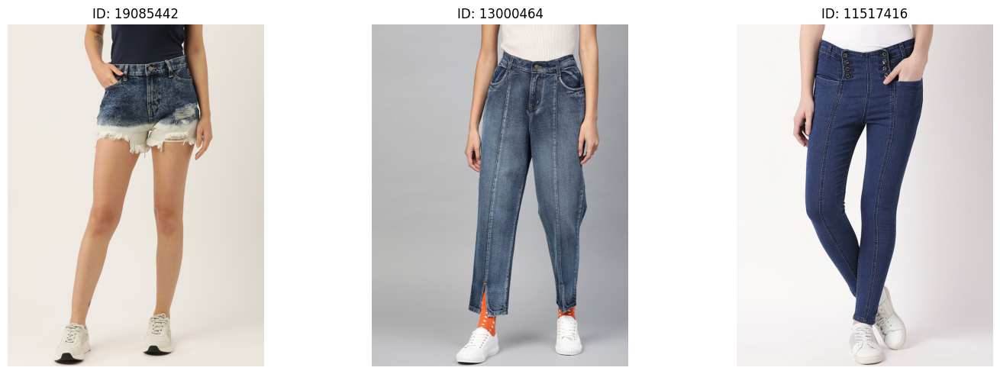

Response: Based on your query for "Dark blue colour denim high waist jeans pant for women" with a requirement of 4+ average rating, here are the top 3 relevant results from the dataset:

1. **Item:** Blue Medium Wash 4-Pocket Highrise Stretchable Jeans
   - **Brand:** SASSAFRAS
   - **Description:** This blue medium wash denim jeans features a high waist design with stretchable fabric for comfort.
   - **Product ID:** 13000464

2. **Item:** Blue Medium Wash 4-Pocket Highrise Jeans
   - **Brand:** High Star
   - **Description:** These highrise jeans in a blue medium wash feature a classic 4-pocket design for practicality.
   - **Product ID:** 11517416

3. **Item:** Blue Medium Wash 4-Pocket Midrise Jeans
   - **Brand:** StyleStone
   - **Description:** Stylish midrise jeans in a blue medium wash with a 4-pocket construction, offering a versatile choice.
   - **Product ID:** 8159185

Based on the provided information, it appears that the specific dark blue color denim high waist jeans pa

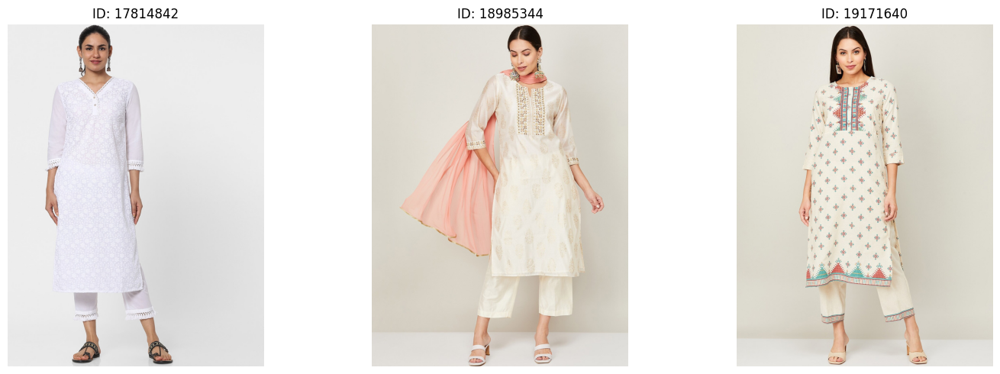

Response: Based on the information provided in the dataset, here are some fashion items that match your query for "Suits in white colour under Rs. 5000":

1. **Product:** White Embroidered Pure Cotton Kurta with Trousers
   - **Brand:** Naari
   - **Description:** A white embroidered pure cotton kurta paired with trousers.
  
2. **Product:** White Printed Kurta with Trousers and Dupatta
   - **Brand:** Melange by Lifestyle
   - **Description:** This set includes a white printed kurta along with trousers and a dupatta.

3. **Product:** Off White Printed Kurta with Trousers
   - **Brand:** Melange by Lifestyle
   - **Description:** An off white printed kurta paired with trousers.

Unfortunately, the dataset does not provide specific pricing information for these items. You can explore these options further on the respective brands' websites or visit fashion stores to check if these suits are available within your price range of Rs. 5000.
--------------------------------------------------

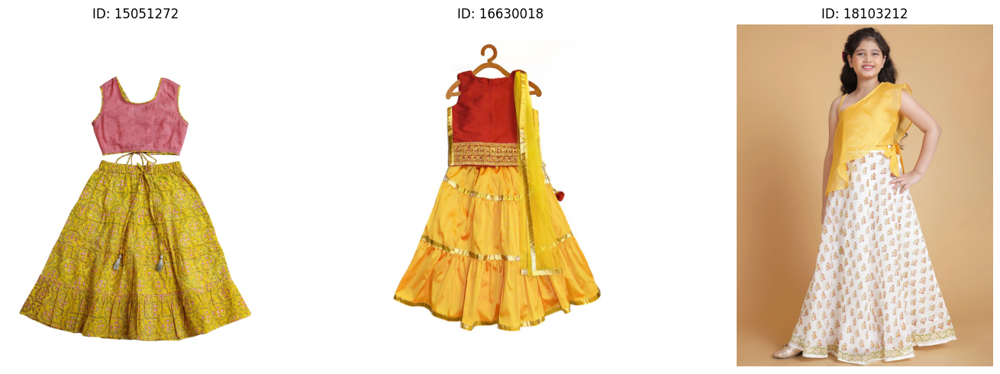

Response: Based on the fashion dataset, I found some relevant items that might interest you for a pink saree for a wedding:

1. **Item**: Pink Yellow Solid Lehenga Choli
   - **Brand**: My Little Lambs
   - **Description**: This lehenga choli features a beautiful pink and yellow solid design which can be a unique choice for a wedding.
   
2. **Item**: Yellow and Maroon Embellished Lehenga Choli
   - **Brand**: A.T.U.N.
   - **Description**: Although this item is not pink, the maroon embellishments combined with yellow can provide a vibrant and elegant look for a wedding.
   
3. **Item**: Yellow and White Solid Lehenga Choli
   - **Brand**: titliyan
   - **Description**: This yellow and white lehenga choli offers a graceful color combination that can be considered for a wedding outfit.

While these items may not be exactly pink sarees, they offer alternative color combinations that could be suitable for a wedding. For a specific pink saree, you might want to explore additional options b

,Question,Response,p_ids,Helpful
0,Black leather jacket,Certainly! Here is the information on black le...,"[18153246, 15555432, 16220586]",yes
1,White dress midi dress.,"Based on the fashion dataset you provided, her...","[17403434, 15082272, 16388990]",yes
2,Dark blue colour denim high waist jeans pant f...,"Based on your query for ""Dark blue colour deni...","[19085442, 13000464, 11517416]",yes
3,Suits in white colour under Rs. 5000,Based on the information provided in the datas...,"[17814842, 18985344, 19171640]",yes
4,Pink saree for wedding.,"Based on the fashion dataset, I found some rel...","[15051272, 16630018, 18103212]",no


In [72]:
# Run the testing pipeline
testing_pipeline(questions)

In [81]:
def testing_pipeline(questions):
    """
    Conducts a testing pipeline for a series of questions, collecting user feedback on the responses provided by the bot.

    Args:
        questions (list): A list of questions to be tested.

    Returns:
        Response
    """
    for question in questions:
      #Print the question
      print(question)

      # Generate the response and product IDs
      top_3_result = query_response(question)
      response, p_ids = generate_response_fashion1(question, top_3_result)

      # Displaying the results
      print(response)

      # Response breaker line
      print('-'*150)

Black leather jacket


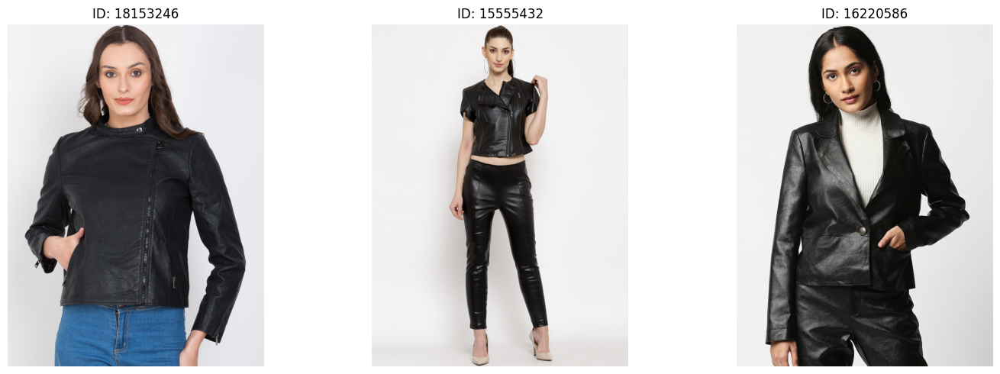

Based on the top 3 search results for "Black leather jacket," here are some relevant fashion items that you may consider:

1. **Item:** Black Solid Leather Jacket
   - **Brand:** Justanned
   - **Description:** This black solid leather jacket features zip detail, making it a stylish and versatile piece for various outfits.

2. **Item:** Black Solid Biker Jacket
   - **Brand:** BEAVER
   - **Description:** A collarless black biker jacket with a unique design, perfect for adding a touch of edginess to your look.

3. **Item:** Black Solid Biker Jacket
   - **Brand:** 20Dresses
   - **Description:** Another black solid biker jacket with a lapel collar, offering a classic yet trendy style option.

These items offer a range of styles and designs in black leather jackets, catering to different fashion preferences. For more detailed information on pricing and availability, you can visit our website page or directly explore the product pages of the cited brands.

If you need further assistance 

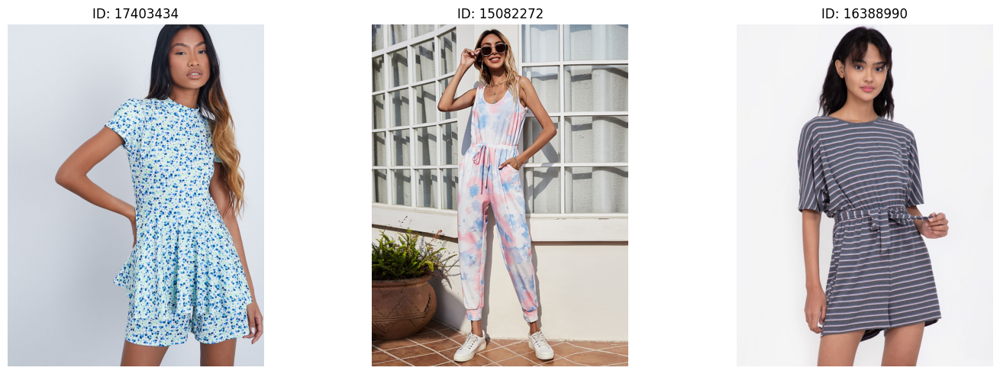

Based on the provided fashion dataset, here are the top 3 search results related to the query "White dress midi dress":

1. **Item Name:** White and Blue Printed Playsuit
   - **Brand:** I Saw It First
   - **Description:** Playsuit with layered sleeves
   - **ID:** 17403434

2. **Item Name:** White and Blue Printed Basic Jumpsuit
   - **Brand:** Mayra
   - **Description:** Basic jumpsuit with waist tie
   - **ID:** 17509632

3. **Item Name:** White, Pink, and Blue Dyed Basic Jumpsuit
   - **Brand:** URBANIC
   - **Description:** Basic jumpsuit
   - **ID:** 15082272

Unfortunately, there are no specific white midi dresses in the top search results matching your query. However, the mentioned white jumpsuits and playsuits could be versatile alternatives for a chic and trendy outfit. For more details on white midi dresses, you may explore the fashion items with similar colors or styles for potential options.

Remember to visit our website for the latest fashion collections and specific wh

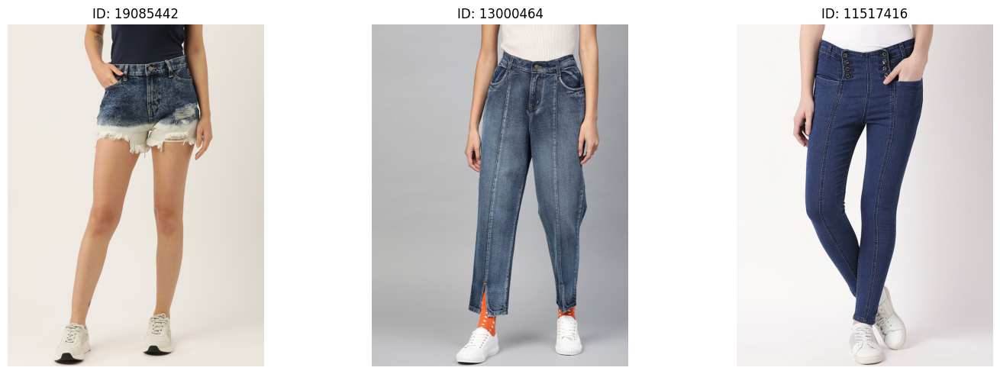

Based on the information provided in the dataset, I found the following relevant fashion items that match your query for dark blue high waist denim jeans for women:

1. Item: Blue Medium Wash 4-Pocket Highrise Stretchable Jeans
   Brand: SASSAFRAS
   Description: These jeans are in a dark blue color with a high waist design, giving a flattering fit. They offer stretchability for comfort and feature 4 pockets for functionality.

2. Item: Blue Medium Wash 4-Pocket Highrise Cropped Jeans
   Brand: SASSAFRAS
   Description: This pair of cropped jeans is designed in a dark blue hue with a high waist silhouette. The cropped length adds a stylish touch to the classic denim look.

3. Item: Blue Medium Wash 4-Pocket Midrise Jeans
   Brand: StyleStone
   Description: These midrise jeans come in a dark blue wash and feature 4 pockets for added convenience. The midrise fit offers a blend of style and comfort for everyday wear.

Unfortunately, none of the provided items explicitly state having a 4+

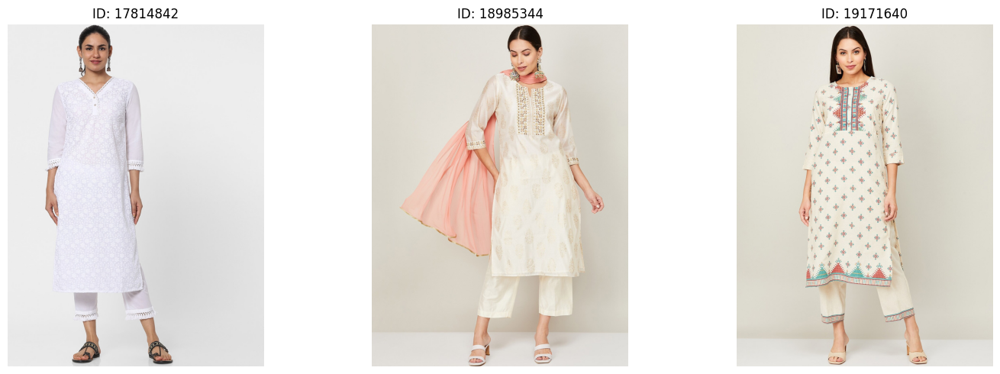

Based on your query for "Suits in white color under Rs. 5000," here are some relevant options based on the available data:

1. **White Embroidered Pure Cotton Kurta with Trousers by Naari**
   - Brand: Naari
   - Description: White embroidered pure cotton kurta with trousers.
   - Price: Information not available in the provided dataset.

2. **White Printed Kurta with Trousers and Dupatta by Melange by Lifestyle**
   - Brand: Melange by Lifestyle
   - Description: White printed kurta with trousers and dupatta.
   - Price: Information not available in the provided dataset.

3. **Off White Printed Kurta with Trousers by Melange by Lifestyle**
   - Brand: Melange by Lifestyle
   - Description: Off white printed kurta with trousers.
   - Price: Information not available in the provided dataset.

Please note that the exact prices for the listed items are not available in the dataset you provided. For updated pricing and availability, I recommend visiting the respective brand's official webs

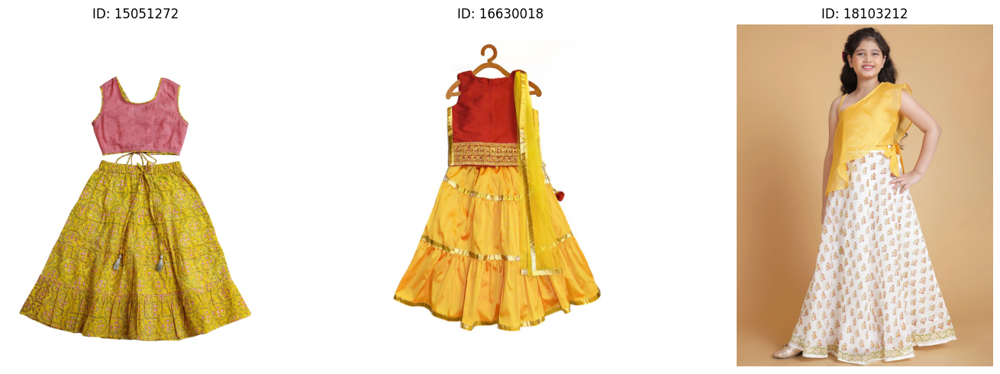

Based on your query for a pink saree for a wedding, here are some relevant findings from the fashion dataset:

1. **Pink Yellow Solid Lehenga Choli by My Little Lambs**
   - Brand: My Little Lambs
   - Colour: Pink
   - Description: This item features a pink and yellow solid lehenga choli, which could be a unique and colorful choice for a wedding.
  
2. **Yellow and Maroon Embellished Lehenga Choli by A.T.U.N.**
   - Brand: A.T.U.N.
   - Colour: Yellow
   - Description: While this item is not pink, it includes yellow tones and embellishments that might complement a wedding look.

3. **Yellow and White Solid Lehenga Choli by titliyan**
   - Brand: titliyan
   - Colour: Yellow
   - Description: This piece showcases a yellow and white solid lehenga choli, offering a bright and elegant option for a wedding outfit.

Although there are no exact matches for a pink saree in the dataset, you might consider the yellow lehengas with pink accents or opt for a custom search to explore more options 

In [82]:
testing_pipeline(questions)

## FUTURE SCOPE:
*  Improving Prompts: Better prompts can enhance the quality of the generated responses.
*   Moderation and Iteration Layer: Adding a moderation layer to filter inappropriate content and an iteration layer to gather more information from users can improve the system's performance.
*   Content and Product-Based Filters: Implementing these filters can further enhance system performance by providing more tailored recommendations.
*  Application Development: The project can be extended to develop a full-fledged application.













## CONCLUSION
The Fashion Search AI project successfully implements a search system using the RAG pipeline and semantic search layer. The system efficiently retrieves and generates relevant fashion product recommendations


By Shivani Raut, Sindhu M and Vidhya Manikandan